# Topic: Image Compression

Team Members: 
- Aryan Bansal
- Chandrima Das
- Keertana Kappuram
- Shreejith Suthraye Gokulnath

In [1]:
import matplotlib.pyplot as plt
from scripts.compress import compress_images
from scripts.visualize import plot_image, plot_compression_metrics, plot_image_comparison
from scripts.common import load_config, load_data

## Exploratory Data Analysis

In [2]:
imgs, df = load_data()
df

,img_name,raw_img_size_in_bytes,img_shape
0,kodim01.png,736501,"(512, 768, 3)"
1,kodim02.png,617995,"(512, 768, 3)"
2,kodim03.png,502888,"(512, 768, 3)"
3,kodim04.png,637432,"(768, 512, 3)"
4,kodim05.png,785610,"(512, 768, 3)"
5,kodim06.png,618959,"(512, 768, 3)"
6,kodim07.png,566322,"(512, 768, 3)"
7,kodim08.png,788470,"(512, 768, 3)"
8,kodim09.png,582899,"(768, 512, 3)"
9,kodim10.png,593463,"(768, 512, 3)"


In [3]:
df["img_shape"].value_counts()

img_shape
(512, 768, 3)    18
(768, 512, 3)     6
Name: count, dtype: int64

In [4]:
print(f'Smallest on-disk image: {df.loc[df["raw_img_size_in_bytes"].argmin(), "img_name"]} | Size: {df["raw_img_size_in_bytes"].min()} bytes')
print(f'Largest on-disk image: {df.loc[df["raw_img_size_in_bytes"].argmax(), "img_name"]}  | Size: {df["raw_img_size_in_bytes"].max()} bytes')
print(f'Average on-disk image size: {float(df["raw_img_size_in_bytes"].mean())} bytes')

Smallest on-disk image: kodim20.png | Size: 492462 bytes
Largest on-disk image: kodim13.png  | Size: 822712 bytes
Average on-disk image size: 641429.375 bytes


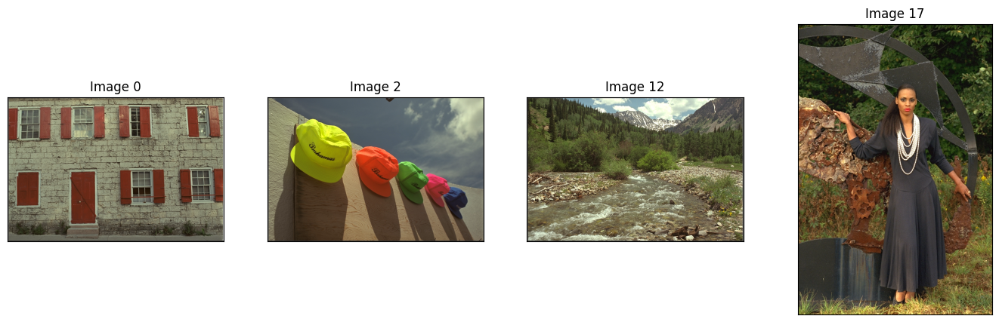

In [5]:
# Plotting a few images

fig, axes = plt.subplots(1, 4, figsize=(17, 5))

idx1 = 0
ax1 = axes[0]
plot_image(imgs[idx1], ax1, f"Image {idx1}")


idx2 = 2
ax2 = axes[1]
plot_image(imgs[idx2], ax2, f"Image {idx2}")

idx3 = 12
ax3 = axes[2]
plot_image(imgs[idx3], ax3, f"Image {idx3}")

idx4 = 17
ax4 = axes[3]
plot_image(imgs[idx4], ax4, f"Image {idx4}")

## Singular Value Decomposition-based Image Compression

In [6]:
explained_variance = [.95, .96, .97, .98, .99, .995, .999]
svd_compressed = compress_images(
    images=imgs, 
    image_names=df["img_name"], 
    method="svd", param_set=explained_variance
)

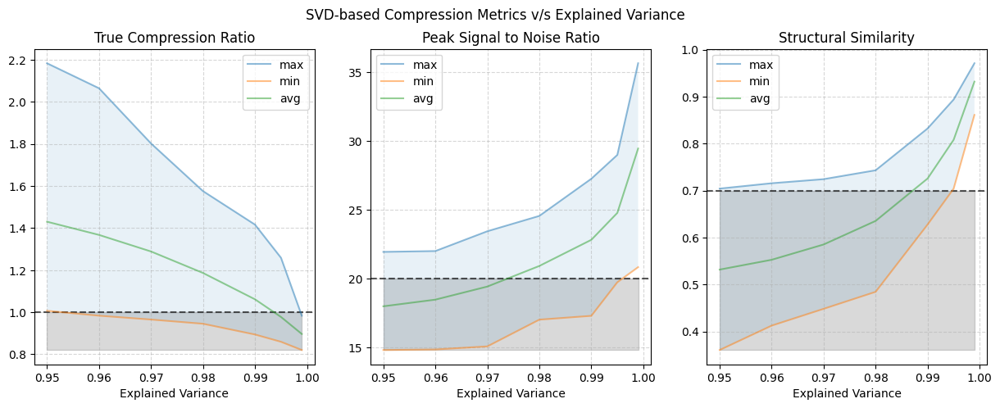

In [7]:
plot_compression_metrics(
    svd_compressed, 
    param_set=explained_variance, 
    suptitle="SVD-based Compression Metrics v/s Explained Variance", 
    xlabel="Explained Variance"
)

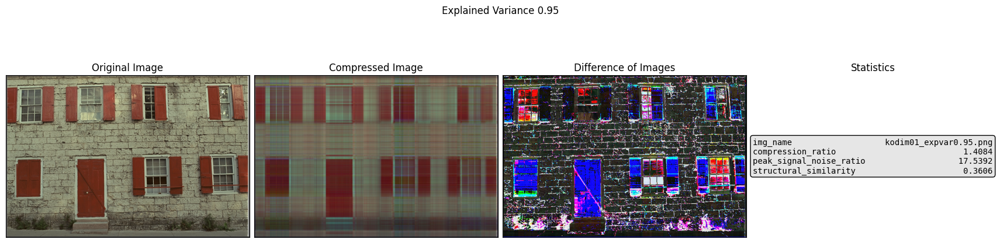

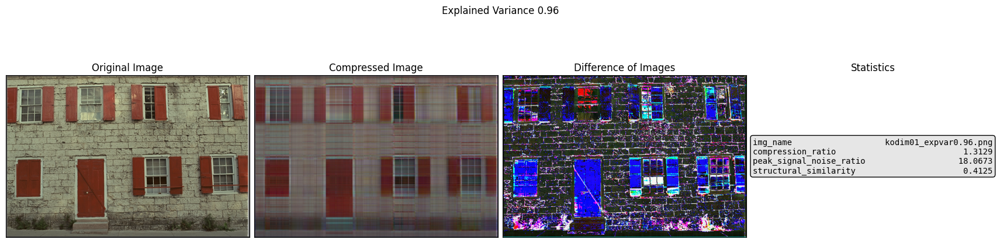

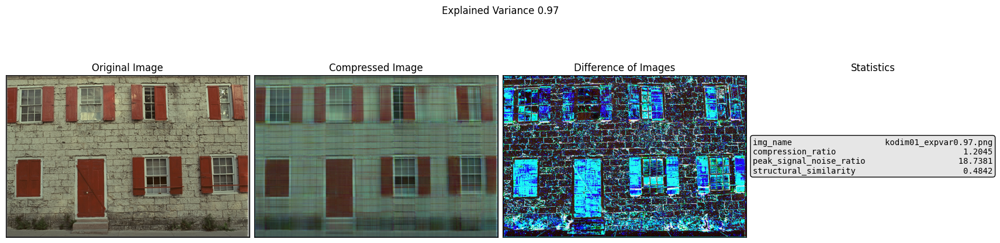

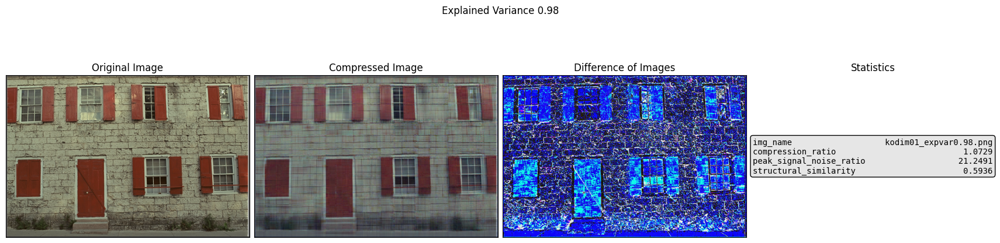

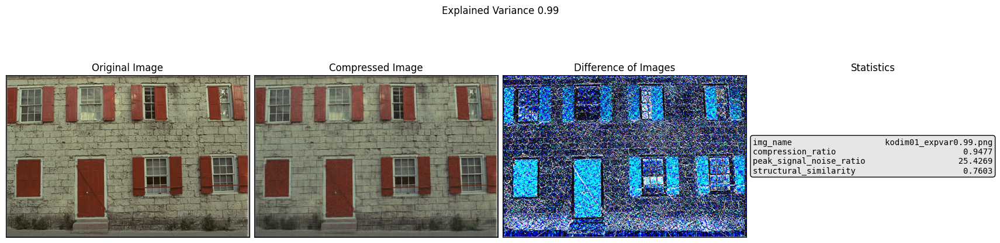

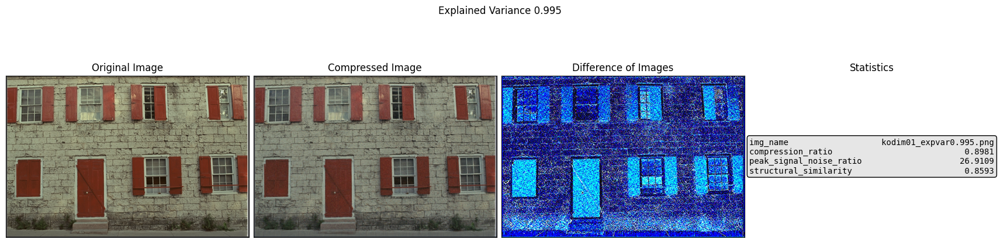

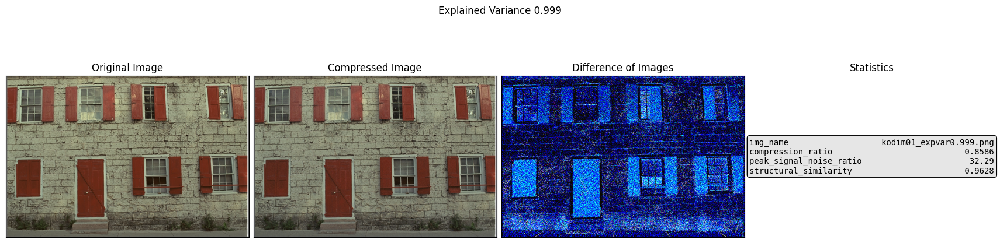

In [8]:
plot_image_comparison(imgs, svd_compressed, "Explained Variance", 0)

## JPEG2000 Compression

In [9]:
compression_ratios = [5, 10, 20, 50, 75, 100]
jp2_compressed = compress_images(imgs, image_names=df["img_name"], method="jp2", param_set=compression_ratios)

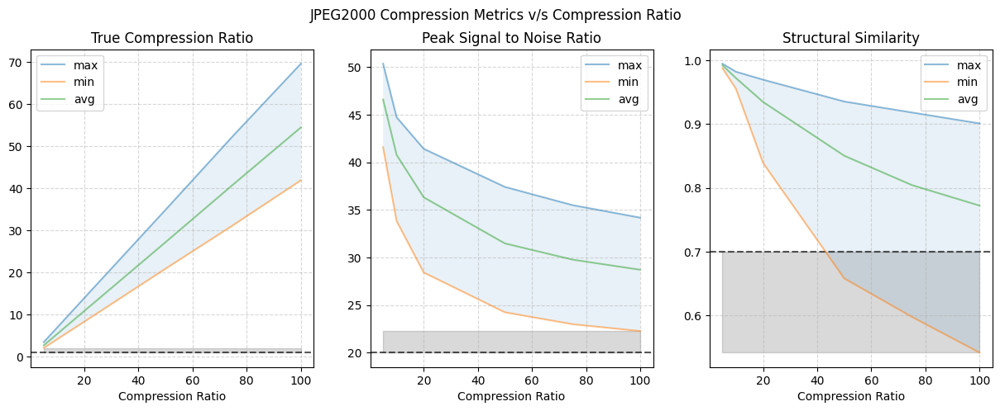

In [10]:
plot_compression_metrics(
    jp2_compressed, 
    param_set=compression_ratios, 
    suptitle="JPEG2000 Compression Metrics v/s Compression Ratio", 
    xlabel="Compression Ratio"
)

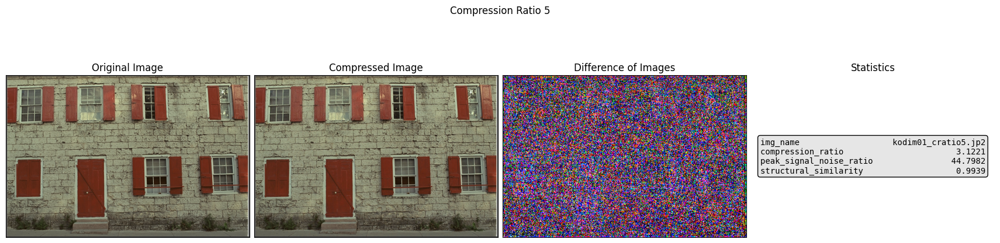

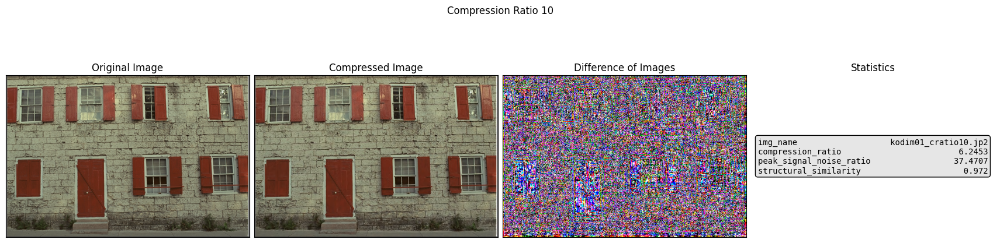

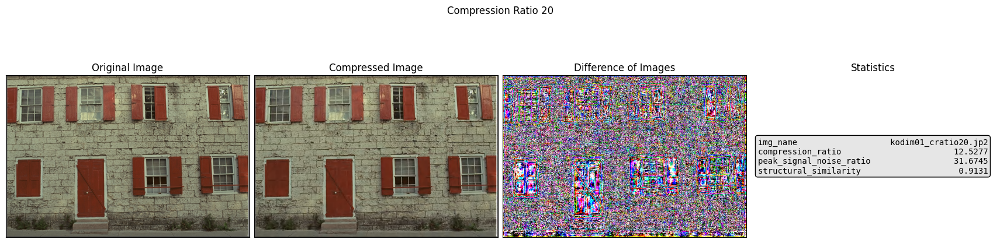

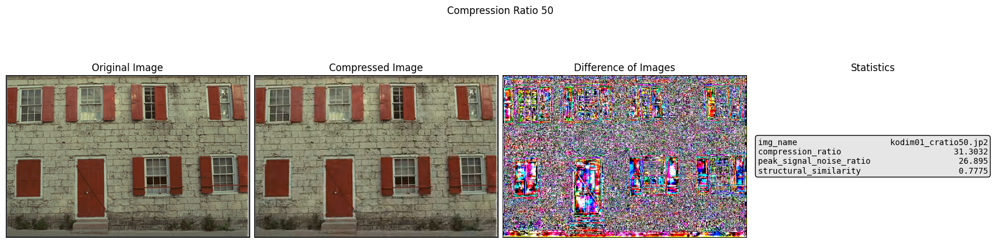

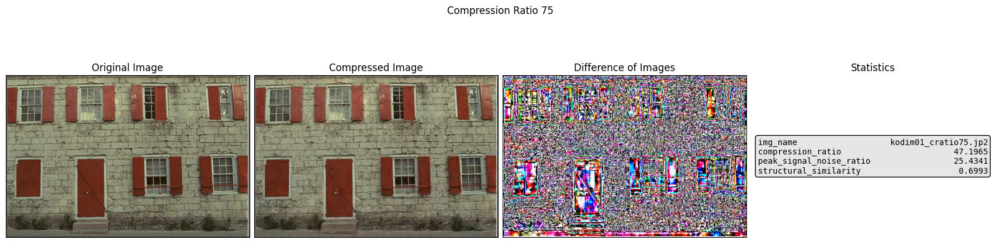

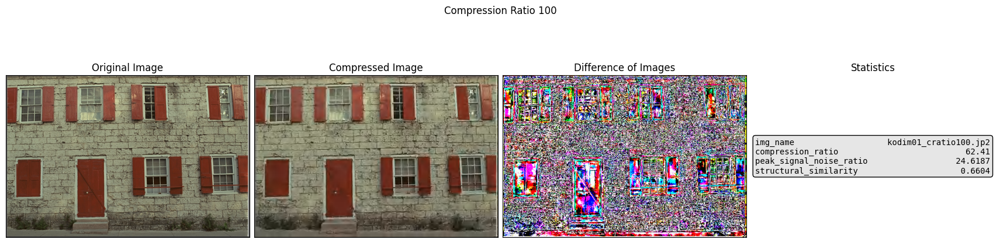

In [11]:
plot_image_comparison(imgs, jp2_compressed, "Compression Ratio", 0)